In [ ]:
!pip install -U torch==1.5 torchvision==0.6 -f https://download.pytorch.org/whl/cu101/torch_stable.html 
!pip install cython pyyaml==5.1
!pip install -U 'git+https://github.com/cocodataset/cocoapi.git#subdirectory=PythonAPI'
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://download.pytorch.org/whl/cu101/torch_stable.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 703.8/703.8 MB 2.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.6/6.6 MB 4.4 MB/s eta 0:00:00
  Attempting uninstall: torch
    Found existing installation: torch 1.13.1+cu116
    Uninstalling torch-1.13.1+cu116:
      Successfully uninstalled torch-1.13.1+cu116
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.14.1+cu116
    Uninstalling torchvision-0.14.1+cu116:
      Successfully uninstalled torchvision-0.14.1+cu116
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
torchtext 0.14.1 requires torch==1.13.1, but you have torch 1.5.0+cu101 which is incompatible.
torchaudio 0.13.1+cu116 requires to

In [ ]:
!pip install detectron2==0.1.3 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.5/index.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.3/6.3 MB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.2/50.2 KB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.2/42.2 KB 5.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for fvcore: filename=fvcore-0.1.5.post20221221-py3-none-any.whl size=61431 sha256=de8647fd248413649f9a8002582c89514e124c52e4c99b3e790c06dbef05a7aa
  Stored in directory: /root/.cache/pip/wheels/b8/79/07/c0e9367f5b5ea325e246bd73651e8af175fabbef943043b1cc
  Created wheel for iopath: filename=iopath-0.1.10-py3-none-any.whl size=31547 sha256=394ec9675835e8f1f78028c3a4442dee571f8933fa45731a9552c5f00beda756
  Stored in directory: /root/.cache/pip/wheels/89/3e/24/0f349c0b2ee

In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

import numpy as np
import cv2
import random
from google.colab.patches import cv2_imshow

from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [ ]:
!curl -L "https://app.roboflow.com/ds/sIl8Cc5T4J?key=WPVlCGrKUf" > roboflow.zip; unzip roboflow.zip; rm roboflow.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100   892  100   892    0     0    266      0  0:00:03  0:00:03 --:--:--   266
100 26.6M  100 26.6M    0     0  4082k      0  0:00:06  0:00:06 --:--:-- 8697k
Archive:  roboflow.zip
 extracting: README.dataset.txt      
 extracting: README.roboflow.txt     
   creating: test/
 extracting: test/CamScanner-01-28-2023-20-00_jpg.rf.374cac25d8d021a4e922f94cb75ba762.jpg  
 extracting: test/_annotations.coco.json  
 extracting: test/photo_2023-01-26_18-29-46_jpg.rf.40612ce9a935641fcc1f55347301c5fc.jpg  
   creating: train/
 extracting: train/CamScanner-01-24-2023-22-31_3_jpg.rf.292e943856d050fffef1872d5376775e.jpg  
 extracting: train/CamScanner-01-24-2023-22-31_3_jpg.rf.73ee2734deb5b8d825ad3e8c6809bd3d.jpg  
 extracting: train/CamScanner-01-24-2023-22-31_3_jpg.rf.b13cfc4b3bea688aade0b155a03c7c69.jpg  
 extracting: train/CamScanner-01-26-

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/train/_annotations.coco.json", "/content/train")
register_coco_instances("my_dataset_val", {}, "/content/valid/_annotations.coco.json", "/content/valid")
register_coco_instances("my_dataset_test", {}, "/content/test/_annotations.coco.json", "/content/test")

WARNING [02/03 09:40:51 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/03 09:40:51 d2.data.datasets.coco]: Loaded 45 images in COCO format from /content/train/_annotations.coco.json


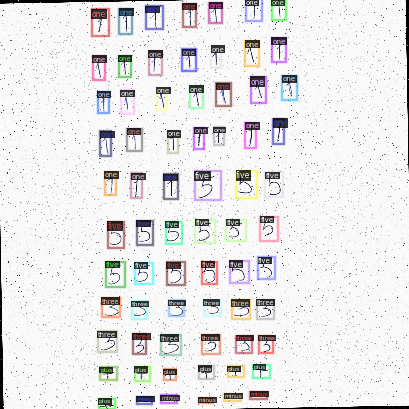

In [ ]:
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

import random
from detectron2.utils.visualizer import Visualizer

for d in random.sample(dataset_dicts, 1):
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.2)
    vis = visualizer.draw_dataset_dict(d)
    cv2_imshow(vis.get_image()[:, :, ::-1])

In [ ]:
from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:
from detectron2.config import get_cfg
import os

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4
cfg.SOLVER.BASE_LR = 0.01


cfg.SOLVER.WARMUP_ITERS = 1200
cfg.SOLVER.MAX_ITER = 1500
cfg.SOLVER.STEPS = (1200, 1500)
cfg.SOLVER.GAMMA = 0.05




cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 64
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 7

cfg.TEST.EVAL_PERIOD = 50


os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

trainer = CocoTrainer(cfg)

[02/03 09:40:56 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

In [ ]:
S# trainer.resume_or_load(resume=False)
# trainer.train()

In [ ]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

<IPython.core.display.Javascript object>

In [ ]:
# from google.colab import drive
# drive.mount('/content/drive/')

# %cp /content/output/* /content/drive/MyDrive/output/
# %cp /content/coco_eval/* /content/drive/MyDrive/coco_eval/

In [ ]:
%cp /content/drive/MyDrive/output/* /content/output/
%cp /content/drive/MyDrive/coco_eval/* /content/coco_eval/

cp: target '/content/coco_eval/' is not a directory


In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.85
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

WARNING [02/03 09:41:41 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[02/03 09:41:41 d2.data.datasets.coco]: Loaded 2 images in COCO format from /content/test/_annotations.coco.json
[02/03 09:41:41 d2.data.build]: Distribution of instances among all 7 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  numbers   | 0            |    equ     | 0            |    five    | 10           |
|   minus    | 12           |    one     | 8            |    plus    | 9            |
|   three    | 9            |            |              |            |              |
|   total    | 48           |            |              |            |              |
[02/03 09:41:41 d2.data.common]: Serializing 2 elements to byte tensors and concatenating them all ...
[02/03 09:41:41 d2.data.common]: Serialized data

OrderedDict([('bbox',
              {'AP': 0.0,
               'AP50': 0.0,
               'AP75': 0.0,
               'APs': nan,
               'APm': 0.0,
               'APl': 0.0,
               'AP-numbers': nan,
               'AP-equ': nan,
               'AP-five': 0.0,
               'AP-minus': 0.0,
               'AP-one': 0.0,
               'AP-plus': 0.0,
               'AP-three': 0.0})])

In [ ]:
%ls ./output/

coco_instances_results.json                        last_checkpoint
events.out.tfevents.1675005903.28964d20508a.116.0  metrics.json
events.out.tfevents.1675417263.365c076ce350.809.0  model_final.pth
instances_predictions.pth


In [ ]:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.8   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

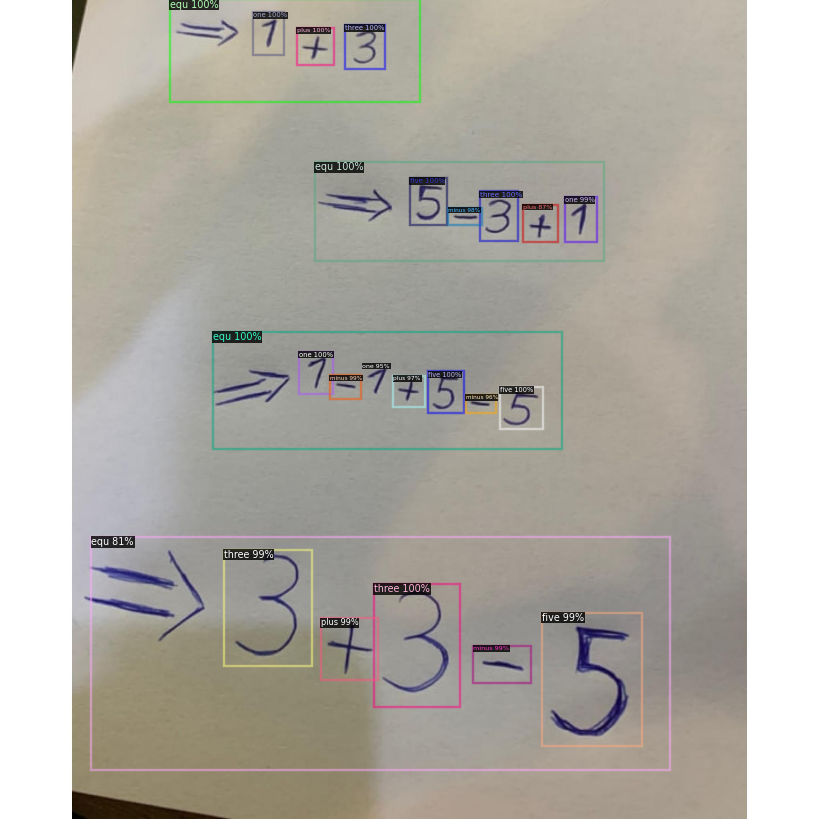

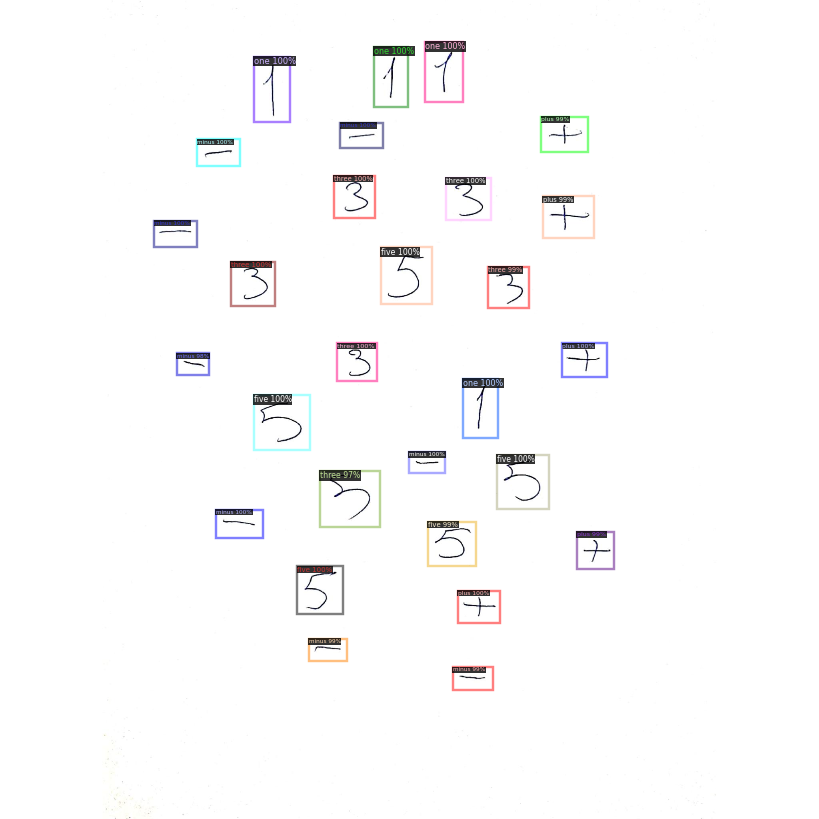

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob


for imageName in glob.glob('/content/test/*jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.4
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

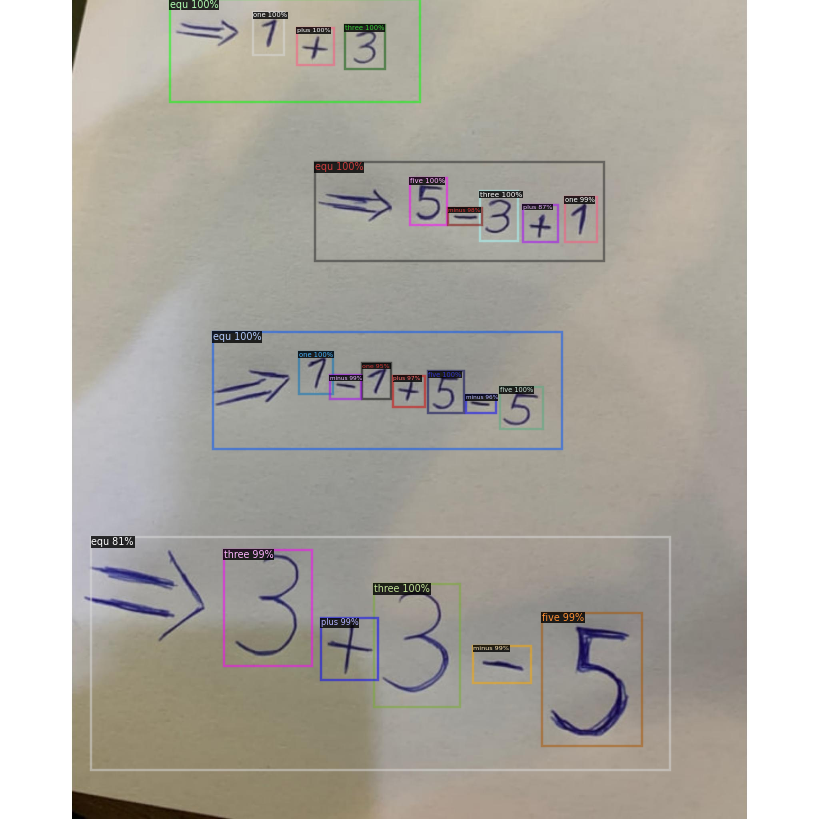

In [ ]:
from detectron2.utils.visualizer import ColorMode
import glob


for imageName in glob.glob('/content/test/photo_2023-01-26_18-29-46_jpg.rf.40612ce9a935641fcc1f55347301c5fc.jpg'):
  im = cv2.imread(imageName)
  outputs = predictor(im)
  v = Visualizer(im[:, :, ::-1],
                metadata=test_metadata, 
                scale=0.4
                 )
  out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
  cv2_imshow(out.get_image()[:, :, ::-1])

In [ ]:
import numpy as np

outputs['instances']

Instances(num_instances=24, image_height=2048, image_width=2048, fields=[pred_boxes: Boxes(tensor([[ 531.5068,  831.2450, 1404.6719, 1123.6541],
        [ 935.3122, 1460.9542, 1150.3837, 1768.6832],
        [ 633.0607,   32.0995,  710.2997,  138.4920],
        [1023.8582,  446.7924, 1117.8096,  562.9416],
        [ 747.2914,  879.9861,  831.4532,  987.2453],
        [ 787.2723,  406.8260, 1510.5396,  652.7413],
        [1070.5510,  929.3508, 1159.3297, 1034.6917],
        [ 742.9150,   71.4713,  835.0174,  164.4297],
        [1199.4156,  479.8297, 1294.1339,  603.4644],
        [1249.8970,  968.4471, 1358.1595, 1073.6636],
        [ 424.5056,    0.0000, 1050.2268,  255.5228],
        [ 861.4347,   64.2730,  963.3210,  173.6006],
        [ 801.7204, 1546.3751,  944.2788, 1701.4755],
        [1411.2704,  494.0201, 1491.3755,  607.2872],
        [ 560.0438, 1374.9254,  779.0957, 1666.6764],
        [1183.5563, 1615.6753, 1328.1017, 1708.7352],
        [1355.2405, 1532.4802, 1605.1816, 186

In [ ]:
outputs['instances'].pred_classes

tensor([1, 6, 4, 2, 4, 1, 2, 5, 6, 2, 1, 6, 5, 4, 6, 3, 2, 3, 3, 5, 3, 4, 5, 1],
       device='cuda:0')

In [ ]:
outputs['instances'].pred_boxes.get_centers()

tensor([[ 968.0894,  977.4495],
        [1042.8479, 1614.8187],
        [ 671.6802,   85.2958],
        [1070.8339,  504.8670],
        [ 789.3723,  933.6157],
        [1148.9060,  529.7837],
        [1114.9404,  982.0212],
        [ 788.9662,  117.9505],
        [1246.7748,  541.6470],
        [1304.0283, 1021.0554],
        [ 737.3662,  127.7614],
        [ 912.3779,  118.9368],
        [ 872.9996, 1623.9253],
        [1451.3230,  550.6536],
        [ 669.5698, 1520.8009],
        [1255.8290, 1662.2053],
        [1480.2111, 1699.6133],
        [ 864.0189,  968.3820],
        [1163.2024,  542.3671],
        [1022.8883,  979.8428],
        [1201.9553, 1010.5167],
        [ 942.0530,  954.0541],
        [1351.5239,  560.0065],
        [ 951.9042, 1635.0371]], device='cuda:0')

In [ ]:
MetadataCatalog.get(cfg.DATASETS.TRAIN[0])

Metadata(evaluator_type='coco', image_root='/content/train', json_file='/content/train/_annotations.coco.json', name='my_dataset_train', thing_classes=['numbers', 'equ', 'five', 'minus', 'one', 'plus', 'three'], thing_dataset_id_to_contiguous_id={0: 0, 1: 1, 2: 2, 3: 3, 4: 4, 5: 5, 6: 6})

In [ ]:
labels_list = list(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes)

labels_num = list(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_dataset_id_to_contiguous_id.values())

In [ ]:
labels_list

['numbers', 'equ', 'five', 'minus', 'one', 'plus', 'three']

In [ ]:
labels_num

[0, 1, 2, 3, 4, 5, 6]

In [ ]:
preds_list = []
for data in outputs["instances"].pred_classes:
  num = data.item()
  preds_list.append(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[num])

In [ ]:
# preds_list.index('equ')

In [ ]:
pred_boxes = outputs['instances'].pred_boxes.tensor.cpu().numpy()

equs = outputs['instances'][outputs['instances'].pred_classes==labels_num[labels_list.index('equ')]].pred_boxes.tensor.cpu().numpy()

In [ ]:
pred_boxes

array([[ 531.50684,  831.245  , 1404.6719 , 1123.654  ],
       [ 935.3122 , 1460.9542 , 1150.3837 , 1768.6832 ],
       [ 633.06067,   32.09947,  710.2997 ,  138.49203],
       [1023.85815,  446.79236, 1117.8096 ,  562.9416 ],
       [ 747.2914 ,  879.9861 ,  831.45325,  987.2453 ],
       [ 787.27234,  406.82602, 1510.5396 ,  652.74133],
       [1070.551  ,  929.35077, 1159.3297 , 1034.6917 ],
       [ 742.91504,   71.47129,  835.0174 ,  164.42966],
       [1199.4156 ,  479.82968, 1294.1339 ,  603.4644 ],
       [1249.897  ,  968.44714, 1358.1595 , 1073.6636 ],
       [ 424.50565,    0.     , 1050.2268 ,  255.52281],
       [ 861.4347 ,   64.273  ,  963.32104,  173.6006 ],
       [ 801.7204 , 1546.3751 ,  944.2788 , 1701.4755 ],
       [1411.2704 ,  494.02008, 1491.3755 ,  607.2872 ],
       [ 560.0438 , 1374.9254 ,  779.0957 , 1666.6764 ],
       [1183.5563 , 1615.6753 , 1328.1017 , 1708.7352 ],
       [1355.2405 , 1532.4802 , 1605.1816 , 1866.7462 ],
       [ 825.09216,  939.31866,

In [ ]:
equs

array([[ 531.50684,  831.245  , 1404.6719 , 1123.654  ],
       [ 787.27234,  406.82602, 1510.5396 ,  652.74133],
       [ 424.50565,    0.     , 1050.2268 ,  255.52281],
       [ 228.73468, 1343.653  , 1675.0736 , 1926.4214 ]], dtype=float32)

In [ ]:
# !pip install opencv-python
import cv2
from google.colab.patches import cv2_imshow

img=cv2.imread('/content/test/photo_2023-01-26_18-29-46_jpg.rf.40612ce9a935641fcc1f55347301c5fc.jpg')
 
# Prints Dimensions of the image
print(img.shape) 
 
# Display the image
# cv2_imshow(img)
# cv2.waitKey(10)
# cv2.destroyAllWindows()
equs_images = []
for i in equs:

  cropped_image = img[int(i[1]):int(i[3]),int(i[0]):int(i[2])]
  equs_images.append(cropped_image)



(2048, 2048, 3)


In [ ]:
pred_boxes_centers = outputs['instances'].pred_boxes.get_centers().cpu().numpy()


In [ ]:
pred_boxes_centers

array([[ 968.08936 ,  977.4495  ],
       [1042.8479  , 1614.8187  ],
       [ 671.6802  ,   85.29575 ],
       [1070.8339  ,  504.86697 ],
       [ 789.3723  ,  933.6157  ],
       [1148.906   ,  529.7837  ],
       [1114.9404  ,  982.02124 ],
       [ 788.9662  ,  117.95047 ],
       [1246.7748  ,  541.64703 ],
       [1304.0283  , 1021.05536 ],
       [ 737.3662  ,  127.761406],
       [ 912.37787 ,  118.9368  ],
       [ 872.99963 , 1623.9253  ],
       [1451.323   ,  550.6536  ],
       [ 669.56976 , 1520.8009  ],
       [1255.829   , 1662.2053  ],
       [1480.211   , 1699.6133  ],
       [ 864.0189  ,  968.382   ],
       [1163.2024  ,  542.36707 ],
       [1022.8883  ,  979.8428  ],
       [1201.9553  , 1010.5167  ],
       [ 942.053   ,  954.0541  ],
       [1351.5239  ,  560.00653 ],
       [ 951.9042  , 1635.0371  ]], dtype=float32)

In [ ]:
pred_boxes_centers=list(pred_boxes_centers)

equ_characters=[]
for i in range(len(equs)):
  boxes_in_equ = []
  for j in range(len(pred_boxes_centers)):
    if pred_boxes_centers[j][0]>equs[i][0] and pred_boxes_centers[j][0]<equs[i][2] and pred_boxes_centers[j][1]>equs[i][1] and pred_boxes_centers[j][1]<equs[i][3]:
      boxes_in_equ.append(j)
  equ_characters.append(boxes_in_equ)
      
print(equ_characters)

[[0, 4, 6, 9, 17, 19, 20, 21], [3, 5, 8, 13, 18, 22], [2, 7, 10, 11], [1, 12, 14, 15, 16, 23]]


In [ ]:
pred_boxes_centers

[array([968.08936, 977.4495 ], dtype=float32),
 array([1042.8479, 1614.8187], dtype=float32),
 array([671.6802 ,  85.29575], dtype=float32),
 array([1070.8339 ,  504.86697], dtype=float32),
 array([789.3723, 933.6157], dtype=float32),
 array([1148.906 ,  529.7837], dtype=float32),
 array([1114.9404 ,  982.02124], dtype=float32),
 array([788.9662 , 117.95047], dtype=float32),
 array([1246.7748 ,  541.64703], dtype=float32),
 array([1304.0283 , 1021.05536], dtype=float32),
 array([737.3662  , 127.761406], dtype=float32),
 array([912.37787, 118.9368 ], dtype=float32),
 array([ 872.99963, 1623.9253 ], dtype=float32),
 array([1451.323 ,  550.6536], dtype=float32),
 array([ 669.56976, 1520.8009 ], dtype=float32),
 array([1255.829 , 1662.2053], dtype=float32),
 array([1480.211 , 1699.6133], dtype=float32),
 array([864.0189, 968.382 ], dtype=float32),
 array([1163.2024 ,  542.36707], dtype=float32),
 array([1022.8883,  979.8428], dtype=float32),
 array([1201.9553, 1010.5167], dtype=float32),
 

In [ ]:
pred_boxes_x = [b[0] for b in pred_boxes_centers]

In [ ]:
equ_characters_x = []

for equ in equ_characters:
  eq1 = []
  for j in range(len(equ)):
    eq1.append(pred_boxes_x[equ[j]])
  equ_characters_x.append(eq1)


In [ ]:
equ_labels=[]
for data in outputs["instances"].pred_classes:
  num=data.item()
  equ_labels.append(MetadataCatalog.get(cfg.DATASETS.TRAIN[0]).thing_classes[num])

In [ ]:
for equ in equ_characters_x:
  for x in sorted(equ):
    j=equ.index(x)
    i=equ_characters_x.index(equ)
    print(equ_characters[i][j], end=" ")
  print()

4 17 21 0 19 6 20 9 
3 5 18 8 22 13 
2 10 7 11 
14 12 23 1 15 16 


In [ ]:
for equ in equ_characters_x:
  for x in sorted(equ):
    j=equ.index(x)
    i=equ_characters_x.index(equ)
    print(equ_labels[equ_characters[i][j]])
  print()
    

one
minus
one
equ
plus
five
minus
five

five
equ
minus
three
plus
one

one
equ
plus
three

three
plus
equ
three
minus
five



In [ ]:
sums=[]
for equ in equ_characters_x:
  sign = "+"
  sum    = 0
  for x in sorted(equ):
    j=equ.index(x)
    i=equ_characters_x.index(equ)

    if equ_labels[equ_characters[i][j]]=="one":
      if sign=="+":
        sum += 1
      elif sign=="-":
        sum -= 1
    elif equ_labels[equ_characters[i][j]]=="three":
      if sign=="+":
        sum += 3
      elif sign=="-":
        sum -=3
    elif equ_labels[equ_characters[i][j]]=="five":
      if sign=="+":
        sum += 5
      elif sign=="-":
        sum -=5
    elif equ_labels[equ_characters[i][j]]=="minus":
      sign = "-"
    elif equ_labels[equ_characters[i][j]]=="plus":
      sign = "+"
    elif equ_labels[equ_characters[i][j]]=="equ":
      pass
  sums.append(sum)
      

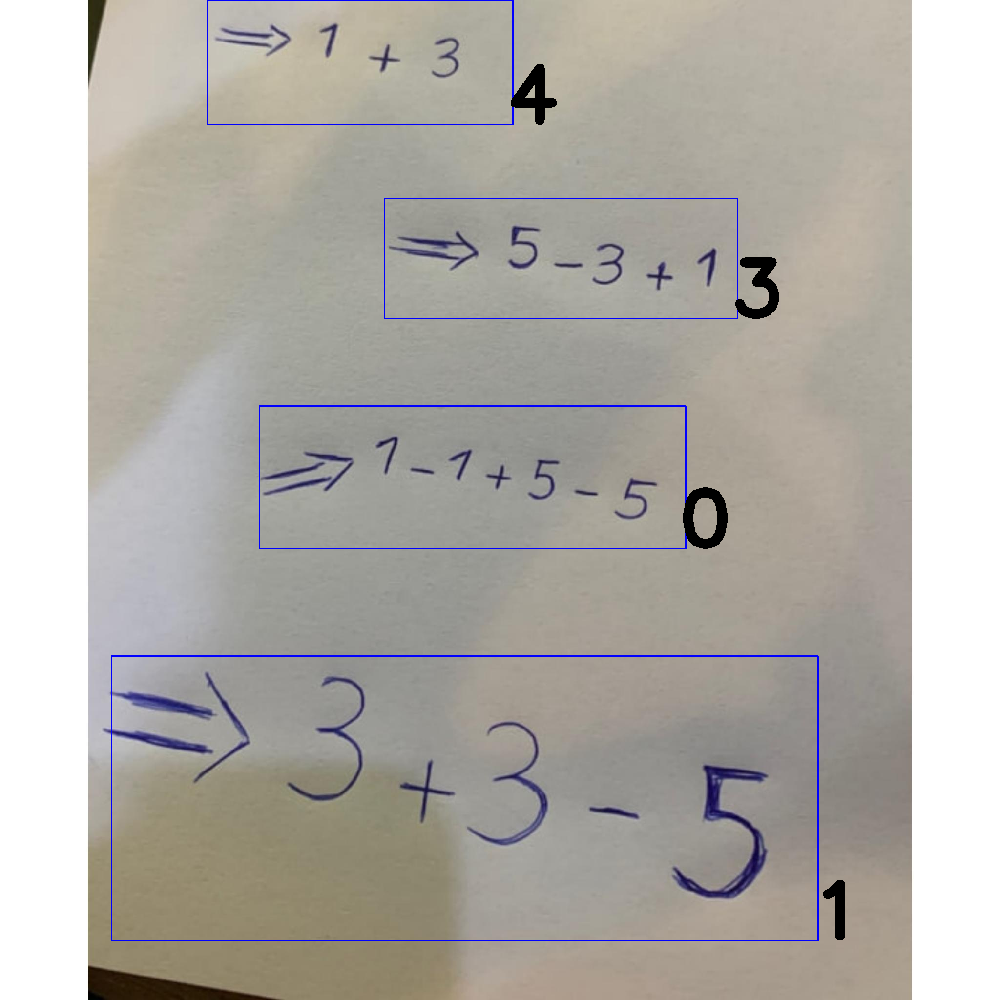

In [ ]:
for i in range(len(equs)):


  start_point = (int(equs[i][0]),int(equs[i][1]))
    

  end_point = (int(equs[i][2]),int(equs[i][3]))
    
  sumsum = str(sums[i])
  color = (255, 0, 0)
  position = (int(equs[i][2])-10, int(equs[i][3])-10)
  thickness = 2
  font = cv2.FONT_ITALIC
  im = cv2.rectangle(im, start_point, end_point, color, thickness)
  im = cv2.putText(im, sumsum, position, font, 5, (0, 0, 0), 20)

cv2_imshow(im) 